# Patient Data Preprocessing Code

## Loading the data

In [33]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import sys
sys.path.append(r"C:\Frank\UoT 2024-2025\MIE8888 Project\SmilePass-2\Recommondation_Trajectory\helper_functions.py") 
from helper_functions import * # Import Ruiwu's helper functions for data cleaning, slicing and aggregating

full_dataset = r"C:\Frank\UoT 2024-2025\MIE8888 Project\full_dataset_2.11.csv"
df = pd.read_csv(full_dataset, encoding="Windows-1252")

C:\Users\frank\AppData\Local\Temp\ipykernel_41604\2720925845.py:9: DtypeWarning: Columns (1,4,10,16,52,85,86,91) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(full_dataset, encoding="Windows-1252")


## Data cleaning, slicing and aggregating

In [5]:
# Define trash columns
trash_columns = ['id_x_x','sikka_sub_task_operation_x_x','office_x_x','guarantor_x','patient','description','visible_to_patient','primary_insurance_estimate','secondary_insurance_estimate','plan_sr_no','insurance_payment','approved','from_pms_x_x','id_y_x','from_pms_y_x','sikka_sub_task_y_x','sikka_sub_task_operation_y_x','uuid','guarantor_y','office_y_x','fullname','first_name','last_name','address','phone','zip_code','practice','primary_insurance_company_id','profile_picture','date_joined','zip_code_flag','address_comp','final_zip_code','id_x_y','from_pms_x_y','office_x_y','treatment','id_y_y','from_pms_y_y','sikka_sub_task_y_y','sikka_sub_task_operation_y_y','office_y_y','procedure_code_x','procedure_code_description','patient_friendly_description','treatment_id','price','fetched_zip_code_flag','zip_code_verified','fetched_zip_code', 'entry_date', 'tooth_from']

df = drop_high_nan_columns(df) # Drop columns with more than 50% missing values
df = df.drop(columns = trash_columns) # Drop trash cols
df = merge_columns_with_priority(df,'health_category','procedure_code_category','treatment_category') # merge to get treatment_category with pattern from two category groups
df = df.dropna() # Drop the remaining NA
df, df_dict = object_processing(df) # Project columns dtype = object; For columns containing datetime, convert it to pd.datetime; For other object columns, encode them
df = days_cal_v2(df,'procedure_date','birth_date', 'procedure_age') # procedure_age
df = days_cal_v2(df,'last_visit','first_visit','visit_period') # visit_period

# # Perform one-hot encoding on the "procedure_code_y" and "treatment_category"
df = one_hot_encode_procedure_and_treatment(df)
# df.to_csv(r'C:\Frank\UoT 2024-2025\MIE8888 Project\M18\output.csv', index=False)

df_next = df.copy() # for next step use

c:\Frank\UoT 2024-2025\MIE8888 Project\SmilePass-2\Recommondation_Trajectory\helper_functions.py:41: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  temp_dt = pd.to_datetime(df[col], errors='raise')
c:\Frank\UoT 2024-2025\MIE8888 Project\SmilePass-2\Recommondation_Trajectory\helper_functions.py:41: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  temp_dt = pd.to_datetime(df[col], errors='raise')
c:\Frank\UoT 2024-2025\MIE8888 Project\SmilePass-2\Recommondation_Trajectory\helper_functions.py:41: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  temp_dt = pd.to_datetime(df[col], error

In [6]:
df_next

,provider_x,amount,treatment_plan_status,procedure_date,patient_id,birth_date,city,state_y,first_visit,last_visit,...,treatment_category_12,treatment_category_13,treatment_category_14,treatment_category_15,treatment_category_16,treatment_category_17,treatment_category_18,treatment_category_19,treatment_category_20,treatment_category_21
0,0,25.22,0,2004-04-19,6672,1991-11-26,0,0,1999-04-14,2020-02-20,...,False,False,False,False,False,False,False,False,False,False
1,0,32.96,0,2004-04-19,6672,1991-11-26,0,0,1999-04-14,2020-02-20,...,False,False,False,False,False,False,False,False,False,False
2,0,47.09,0,2004-04-19,6672,1991-11-26,0,0,1999-04-14,2020-02-20,...,False,False,False,False,False,False,False,False,False,False
3,0,21.36,0,2004-04-19,6672,1991-11-26,0,0,1999-04-14,2020-02-20,...,False,False,False,False,False,False,False,False,False,False
4,1,57.10,0,2007-07-11,2479,1939-01-21,1,0,1991-08-08,2019-04-17,...,False,False,False,False,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
354032,1,25.22,0,2007-07-11,7997,1999-04-07,15,0,2002-08-14,2023-08-23,...,False,False,False,False,False,False,False,False,False,False
354033,1,96.26,0,2007-07-11,7997,1999-04-07,15,0,2002-08-14,2023-08-23,...,False,False,False,False,False,False,False,False,False,False
354034,4,23.66,0,2007-07-11,3107,1960-11-21,0,0,1992-10-13,2024-09-27,...,False,False,False,False,False,False,False,False,False,False
354035,3,87.06,0,1996-12-12,2679,1976-06-05,0,0,1991-12-10,2013-05-14,...,False,False,False,False,False,False,False,False,False,False


## Data Segmentation v1 v3 v1v3

In [ ]:
# New classifiaction stream
df_next = df.copy()
def classify_patient(group):
    procedure_dates = group.sort_values('procedure_date')['procedure_date']

    # Calculate total treatment span in years
    span_years = (group['last_visit'].iloc[0] - group['first_visit'].iloc[0]).days / 365.0

    # Calculate max gap between consecutive visits in years
    gaps = procedure_dates.diff().dropna().dt.days / 365.0
    max_gap = gaps.max() if not gaps.empty else 0

    # Classification rules
    if max_gap <= 2:
        if span_years >= 3:
            return 'V1'  # Consistent long history
        else:
            return 'V2'  # Consistent short history
    elif max_gap > 2 and span_years >= 7:
        return 'V3'  # Inconsistent but long history
    else:
        return 'V4'  # Inconsistent and short history (everything else)

# Apply the classification to each patient group
patient_versions = df_next.groupby('patient_id').apply(classify_patient).reset_index()
patient_versions.columns = ['patient_id', 'version']

# Merge version info back into the main dataset
df_next = df_next.merge(patient_versions, on='patient_id')

C:\Users\frank\AppData\Local\Temp\ipykernel_41604\2702337505.py:25: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  patient_versions = df_next.groupby('patient_id').apply(classify_patient).reset_index()


In [ ]:
df_v1 = df_next[df_next['version'] == 'V1']
df_v2 = df_next[df_next['version'] == 'V2']
df_v3 = df_next[df_next['version'] == 'V3']
df_v4 = df_next[df_next['version'] == 'V4']
df_v1_v3 = df_next[df_next['version'].isin(['V1', 'V3'])]

In [ ]:
df_v1_v3

,provider_x,amount,treatment_plan_status,procedure_date,patient_id,birth_date,city,state_y,first_visit,last_visit,...,treatment_category_13,treatment_category_14,treatment_category_15,treatment_category_16,treatment_category_17,treatment_category_18,treatment_category_19,treatment_category_20,treatment_category_21,version
0,0,25.22,0,2004-04-19,6672,1991-11-26,0,0,1999-04-14,2020-02-20,...,False,False,False,False,False,False,False,False,False,V3
1,0,32.96,0,2004-04-19,6672,1991-11-26,0,0,1999-04-14,2020-02-20,...,False,False,False,False,False,False,False,False,False,V3
2,0,47.09,0,2004-04-19,6672,1991-11-26,0,0,1999-04-14,2020-02-20,...,False,False,False,False,False,False,False,False,False,V3
3,0,21.36,0,2004-04-19,6672,1991-11-26,0,0,1999-04-14,2020-02-20,...,False,False,False,False,False,False,False,False,False,V3
4,1,57.10,0,2007-07-11,2479,1939-01-21,1,0,1991-08-08,2019-04-17,...,False,False,False,False,False,False,False,False,False,V3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
332510,1,25.22,0,2007-07-11,7997,1999-04-07,15,0,2002-08-14,2023-08-23,...,False,False,False,False,False,False,False,False,False,V3
332511,1,96.26,0,2007-07-11,7997,1999-04-07,15,0,2002-08-14,2023-08-23,...,False,False,False,False,False,False,False,False,False,V3
332512,4,23.66,0,2007-07-11,3107,1960-11-21,0,0,1992-10-13,2024-09-27,...,False,False,False,False,False,False,False,False,False,V1
332513,3,87.06,0,1996-12-12,2679,1976-06-05,0,0,1991-12-10,2013-05-14,...,False,False,False,False,False,False,False,False,False,V3


## Complete dataset to reflect each patient_id's treatment pattern

`meta_cols`: Metadata fields you want to keep for each patient.  
`base_cols`: Core identifiers used for reshaping.

In [7]:
meta_cols = ['provider_x', 'amount', 'treatment_plan_status', 'patient_id', 'city','state_y', 'sikka_provider_id', 'LATITUDE', 'LONGITUDE', 'procedure_age', 'visit_period']
base_cols = ['patient_id', 'procedure_age']

# Select relevant columns and store as df_subset
procedure_cols = [col for col in df_next.columns if col.startswith('procedure_code_y_') or col.startswith('treatment_category_')]
df_subset = df_next[base_cols + procedure_cols].copy()
df_subset['procedure_age'] = df_subset['procedure_age'].astype(int) # procedure_age to int

# Melt one-hot to long format
# Each row now represents a (patient, procedure_code, procedure_age) triple with a binary flag.
df_long = df_subset.melt(
    id_vars=['patient_id', 'procedure_age'],
    value_vars=procedure_cols,
    var_name='procedure_code',
    value_name='occurred'
)

In [ ]:
df_long

,patient_id,procedure_age,procedure_code,occurred
0,6672,12,procedure_code_y_1011,False
1,6672,12,procedure_code_y_1011,False
2,6672,12,procedure_code_y_1011,False
3,6672,12,procedure_code_y_1011,False
4,2479,68,procedure_code_y_1011,False
...,...,...,...,...
200839055,7997,8,treatment_category_21,False
200839056,7997,8,treatment_category_21,False
200839057,3107,46,treatment_category_21,False
200839058,2679,20,treatment_category_21,False


In [8]:
# Keep only procedure occurred
df_long = df_long[df_long['occurred'] == 1]
# Create combined feature name
df_long['feature'] = df_long['procedure_code'] + '_age' + df_long['procedure_age'].astype(str)

In [ ]:
df_long

,patient_id,procedure_age,procedure_code,occurred,feature
51800,12225,2,procedure_code_y_1011,True,procedure_code_y_1011_age2
213078,13174,1,procedure_code_y_1011,True,procedure_code_y_1011_age1
213196,13153,1,procedure_code_y_1011,True,procedure_code_y_1011_age1
215476,12135,3,procedure_code_y_1011,True,procedure_code_y_1011_age3
295741,13170,3,procedure_code_y_1011,True,procedure_code_y_1011_age3
...,...,...,...,...,...
200816632,2591,52,treatment_category_21,True,treatment_category_21_age52
200830910,9773,44,treatment_category_21,True,treatment_category_21_age44
200832774,1524,54,treatment_category_21,True,treatment_category_21_age54
200833028,4524,53,treatment_category_21,True,treatment_category_21_age53


Each patient had a specific procedure at a specific age  
Patient_id -> procedure_code_##_age_##

In [11]:
# Pivot to wide format
final_df = df_long.groupby(['patient_id', 'feature']).size().unstack(fill_value=0)
final_df = final_df.reset_index()
# Get metadata
patient_meta = df_next[meta_cols].groupby('patient_id').first().reset_index()
final_df = pd.merge(patient_meta, final_df, on='patient_id', how='left')

final_df

,patient_id,provider_x,amount,treatment_plan_status,city,state_y,sikka_provider_id,LATITUDE,LONGITUDE,procedure_age,...,treatment_category_9_age88,treatment_category_9_age89,treatment_category_9_age9,treatment_category_9_age90,treatment_category_9_age91,treatment_category_9_age92,treatment_category_9_age93,treatment_category_9_age95,treatment_category_9_age96,treatment_category_9_age99
0,1,1,663.00,1,0,0,0,43.818875,-79.559466,55.693151,...,0,0,0,0,0,0,0,0,0,0
1,2,7,77.19,0,0,0,0,43.818875,-79.559466,41.287671,...,0,0,0,0,0,0,0,0,0,0
2,3,5,19.96,0,0,0,0,43.818875,-79.559466,24.797260,...,0,0,0,0,0,0,0,0,0,0
3,4,7,55.49,0,0,0,0,43.835469,-79.555076,15.202740,...,0,0,0,0,0,0,0,0,0,0
4,5,1,220.00,1,0,0,0,43.818875,-79.559466,20.156164,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10253,13579,10,8.75,1,0,0,0,43.838741,-79.563329,10.989041,...,0,0,0,0,0,0,0,0,0,0
10254,13580,10,30.15,1,0,0,0,43.838741,-79.563329,6.621918,...,0,0,0,0,0,0,0,0,0,0
10255,13583,11,160.14,0,12,0,0,43.840925,-79.551739,8.013699,...,0,0,0,0,0,0,0,0,0,0
10256,13584,2,0.00,2,9,0,2,43.671953,-79.399170,39.789041,...,0,0,0,0,0,0,0,0,0,0


## Applied Truncated SVD for sparse binary data of large sparse matrices.

In [12]:
meta_cols

['provider_x',
 'amount',
 'treatment_plan_status',
 'patient_id',
 'city',
 'state_y',
 'sikka_provider_id',
 'LATITUDE',
 'LONGITUDE',
 'procedure_age',
 'visit_period']

### Full data svd

In [ ]:
# use the complete dataset to reflect each patient_id's treatment pattern in last section

from sklearn.decomposition import TruncatedSVD
from scipy.sparse import csr_matrix

# columns to exclude from SVD
non_binary_cols = ['provider_x', 'amount', 'treatment_plan_status', 'patient_id', 'city', 'state_y','sikka_provider_id', 'LATITUDE', 'LONGITUDE', 'procedure_age', 'visit_period']
meta_df = final_df[non_binary_cols].copy()
binary_df = final_df.drop(columns=non_binary_cols)

# Apply TruncatedSVD on binary columns
X_sparse = csr_matrix(binary_df.values)
svd = TruncatedSVD(n_components=100, random_state=823)
X_svd = svd.fit_transform(X_sparse)

svd_features = pd.DataFrame(X_svd, columns=[f"SVD_{i+1}" for i in range(X_svd.shape[1])])
df_svd = pd.concat([meta_df.reset_index(drop=True), svd_features], axis=1)

In [14]:
df_svd

,patient_id,SVD_1,SVD_2,SVD_3,SVD_4,SVD_5,SVD_6,SVD_7,SVD_8,SVD_9,...,SVD_91,SVD_92,SVD_93,SVD_94,SVD_95,SVD_96,SVD_97,SVD_98,SVD_99,SVD_100
0,1,2.577456,5.391745,0.346819,-2.610816,-0.269007,-1.647562,0.967821,0.227678,0.748070,...,0.129302,0.679257,-1.310237,0.418749,-0.268478,-0.459666,-0.326420,1.408708,0.994770,0.192471
1,2,2.747369,7.242950,-4.705268,0.987024,0.080300,-2.092063,-2.668809,-0.139134,-0.882080,...,-0.654086,-0.537491,-1.120165,-1.128762,-1.012749,-0.084358,-0.711287,-0.395388,0.613275,0.074925
2,3,3.076240,-0.974614,1.241584,2.376949,0.652609,-1.694941,0.464753,-0.267825,1.166560,...,-0.204574,0.109031,0.210161,0.171720,-0.255636,-0.013390,0.474894,0.300367,-0.243592,0.265608
3,4,5.015009,2.628336,4.321943,0.766124,-0.142786,-1.000115,1.597067,-1.490356,1.601017,...,0.918200,0.409798,-0.146121,-0.312076,-0.171364,0.058218,-1.386143,-0.632145,-0.839857,1.715160
4,5,2.421528,-1.165215,-0.144792,0.548771,0.211493,-0.694360,0.514054,0.408591,0.191974,...,-0.086875,0.040611,0.077501,-0.113327,0.063478,0.000552,-0.151971,0.158655,0.031298,0.016163
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10253,13579,1.464824,-0.889404,-0.892605,-1.196315,-0.354370,1.009884,-0.470259,-0.403135,0.165099,...,-0.068137,-0.276409,-0.101999,0.251203,0.078569,-0.247758,-0.088183,-0.133617,0.008568,-0.066537
10254,13580,1.218903,-0.769397,-0.855787,-1.218935,-0.383631,1.215900,-0.919034,-1.103159,1.709797,...,-0.121298,0.139158,-0.051260,0.559763,-0.378192,0.501527,0.180905,-0.128073,0.051764,-0.046494
10255,13583,0.120622,-0.074183,-0.074810,-0.096579,-0.028176,0.083213,-0.052826,-0.061032,0.079002,...,-0.036826,0.026531,0.019474,0.025020,0.052504,0.037267,0.025919,-0.034039,0.031956,-0.011931
10256,13584,0.010246,0.015434,0.016436,-0.011152,-0.008507,0.012651,0.029651,0.020853,0.029507,...,0.023530,0.026105,-0.016765,-0.005024,0.015098,0.032073,-0.010145,-0.012431,0.015550,0.046990


In [13]:
df_svd

,provider_x,amount,treatment_plan_status,patient_id,city,state_y,sikka_provider_id,LATITUDE,LONGITUDE,procedure_age,...,SVD_91,SVD_92,SVD_93,SVD_94,SVD_95,SVD_96,SVD_97,SVD_98,SVD_99,SVD_100
0,1,663.00,1,1,0,0,0,43.818875,-79.559466,55.693151,...,0.129302,0.679257,-1.310237,0.418749,-0.268478,-0.459666,-0.326420,1.408708,0.994770,0.192471
1,7,77.19,0,2,0,0,0,43.818875,-79.559466,41.287671,...,-0.654086,-0.537491,-1.120165,-1.128762,-1.012749,-0.084358,-0.711287,-0.395388,0.613275,0.074925
2,5,19.96,0,3,0,0,0,43.818875,-79.559466,24.797260,...,-0.204574,0.109031,0.210161,0.171720,-0.255636,-0.013390,0.474894,0.300367,-0.243592,0.265608
3,7,55.49,0,4,0,0,0,43.835469,-79.555076,15.202740,...,0.918200,0.409798,-0.146121,-0.312076,-0.171364,0.058218,-1.386143,-0.632145,-0.839857,1.715160
4,1,220.00,1,5,0,0,0,43.818875,-79.559466,20.156164,...,-0.086875,0.040611,0.077501,-0.113327,0.063478,0.000552,-0.151971,0.158655,0.031298,0.016163
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10253,10,8.75,1,13579,0,0,0,43.838741,-79.563329,10.989041,...,-0.068137,-0.276409,-0.101999,0.251203,0.078569,-0.247758,-0.088183,-0.133617,0.008568,-0.066537
10254,10,30.15,1,13580,0,0,0,43.838741,-79.563329,6.621918,...,-0.121298,0.139158,-0.051260,0.559763,-0.378192,0.501527,0.180905,-0.128073,0.051764,-0.046494
10255,11,160.14,0,13583,12,0,0,43.840925,-79.551739,8.013699,...,-0.036826,0.026531,0.019474,0.025020,0.052504,0.037267,0.025919,-0.034039,0.031956,-0.011931
10256,2,0.00,2,13584,9,0,2,43.671953,-79.399170,39.789041,...,0.023530,0.026105,-0.016765,-0.005024,0.015098,0.032073,-0.010145,-0.012431,0.015550,0.046990


### v1 v3 and v1v3 svd

In [14]:
from sklearn.decomposition import TruncatedSVD
from scipy.sparse import csr_matrix

# Shared constants
meta_cols = ['provider_x', 'amount', 'treatment_plan_status', 'patient_id', 'city', 'state_y',
             'sikka_provider_id', 'LATITUDE', 'LONGITUDE', 'procedure_age', 'visit_period']
non_binary_cols = ['patient_id']

# Pipline functon for svd
def perform_svd_pipeline(df, name, n_components = 100):
    df_next = df.copy()
    
    # Select relevant columns
    base_cols = ['patient_id', 'procedure_age']
    procedure_cols = [col for col in df_next.columns if col.startswith('procedure_code_y_') or col.startswith('treatment_category_')]
    df_subset = df_next[base_cols + procedure_cols].copy()
    df_subset['procedure_age'] = df_subset['procedure_age'].astype(int)
    # Melt one-hot to long format
    df_long = df_subset.melt(
        id_vars=['patient_id', 'procedure_age'],
        value_vars=procedure_cols,
        var_name='procedure_code',
        value_name='occurred'
    )
    df_long = df_long[df_long['occurred'] == 1]
    df_long['feature'] = df_long['procedure_code'] + '_age' + df_long['procedure_age'].astype(str)
    # Pivot to wide format
    final_df = df_long.groupby(['patient_id', 'feature']).size().unstack(fill_value=0).reset_index()

    # # Attach metadata
    # patient_meta = df_next[meta_cols].groupby('patient_id').first().reset_index()
    # final_df = pd.merge(patient_meta, final_df, on='patient_id', how='left')

    # Split for SVD
    meta_df = final_df[non_binary_cols].copy()
    binary_df = final_df.drop(columns=non_binary_cols)
    # Apply SVD
    X_sparse = csr_matrix(binary_df.values)
    svd = TruncatedSVD(n_components, random_state=823)
    X_svd = svd.fit_transform(X_sparse)
    svd_features = pd.DataFrame(X_svd, columns=[f"SVD_{i+1}" for i in range(X_svd.shape[1])])
    
    # Combine
    df_svd = pd.concat([meta_df.reset_index(drop=True), svd_features], axis=1)
    print(f"Completed SVD for {name}: {df_svd.shape[0]} patients, {df_svd.shape[1]} features")
    return df_svd

In [19]:
# Input dataframes
datasets = {
    "v1": df_v1.copy(),
    "v3": df_v3.copy(),
    "v1v3": df_v1_v3.copy()
}

svd_results = {}
for name, df in datasets.items():
    svd_results[name] = perform_svd_pipeline(df, name)

# Access results
df_svd_v1 = svd_results["v1"]
df_svd_v3 = svd_results["v3"]
df_svd_v1_v3 = svd_results["v1v3"]

Completed SVD for v1: 2404 patients, 101 features
Completed SVD for v3: 3164 patients, 101 features
Completed SVD for v1v3: 5568 patients, 101 features


In [20]:
df_svd_v1_v3

,patient_id,SVD_1,SVD_2,SVD_3,SVD_4,SVD_5,SVD_6,SVD_7,SVD_8,SVD_9,...,SVD_91,SVD_92,SVD_93,SVD_94,SVD_95,SVD_96,SVD_97,SVD_98,SVD_99,SVD_100
0,1,2.488313,5.427380,0.479776,-2.641114,-1.334281,1.323480,0.325631,0.699652,0.375685,...,-0.155424,-0.043870,-0.570891,-1.162204,-0.620533,-0.250560,0.456180,0.101964,0.270738,0.143480
1,2,2.665084,7.353473,-4.620293,0.737040,-2.391748,-2.220761,-0.932304,-0.748041,0.146410,...,0.109816,0.691093,0.162120,-0.403846,-1.029669,2.952483,-0.521547,0.679192,-0.604858,-0.136349
2,3,3.079523,-0.914833,1.271482,2.397652,-1.682732,0.510812,-0.296316,1.321766,1.027263,...,-0.031901,-0.221578,-0.294011,-0.214762,0.303107,-0.359705,-0.254895,-0.253499,0.095908,-0.414656
3,4,4.934024,2.692889,4.402117,0.855459,-0.443406,1.829758,-1.002629,2.112340,-0.527406,...,-0.449374,0.351423,-0.155019,0.464609,0.558380,-0.400639,-0.524312,0.867817,0.507852,0.004563
4,5,2.438157,-1.111369,-0.098404,0.612009,-0.730451,0.469857,0.391375,0.333426,0.734827,...,0.224008,0.096978,0.076309,0.269366,-0.248720,-0.210146,0.279231,0.103999,0.249110,0.006453
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5563,12838,1.144218,-0.154506,0.996815,1.375963,-0.501053,-0.356218,-1.079591,1.349286,-0.080942,...,0.120920,0.101719,-0.058635,0.064908,-0.047559,0.215952,0.163626,-0.130463,-0.125835,-0.419468
5564,12844,1.182409,-0.724451,-0.882000,-1.309915,1.266700,-0.847259,-1.113605,1.758336,2.049011,...,-0.162706,0.082436,0.002443,-0.357617,-0.150800,-0.223054,-0.052572,-0.100555,0.157200,0.141329
5565,12845,0.770005,2.317500,-2.140986,1.020550,-0.323159,-2.251004,2.113823,0.909904,-0.001703,...,-0.863024,-0.073670,0.251330,-0.261847,0.166480,0.995863,-0.289659,-0.598877,0.265399,-0.555963
5566,12873,0.141037,0.480958,-0.789522,0.856504,0.778662,0.621818,-0.130777,0.147893,-0.379761,...,-0.283092,0.385800,-0.185590,-0.005074,-0.338428,0.103158,0.321128,0.153460,0.010058,-0.111347


## Dataframe for age groups, start from 5-10, up to 85-90

In [23]:
import os

# 5 year window
def age_to_group_5_year(age):
    try:
        age = int(age)
        if age < 0:
            return "invalid"
        lower = (age // 5) * 5
        upper = lower + 5
        if lower > upper:
            return "invalid"
        return f"{lower}-{upper}"
    except:
        return "invalid"

In [24]:
df_v1_v3['age_group'] = df_v1_v3['procedure_age'].apply(age_to_group_5_year)

C:\Users\frank\AppData\Local\Temp\ipykernel_41604\1667221112.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_v1_v3['age_group'] = df_v1_v3['procedure_age'].apply(age_to_group_5_year)


In [35]:
df_next

,provider_x,amount,treatment_plan_status,procedure_date,patient_id,birth_date,city,state_y,first_visit,last_visit,...,treatment_category_13,treatment_category_14,treatment_category_15,treatment_category_16,treatment_category_17,treatment_category_18,treatment_category_19,treatment_category_20,treatment_category_21,version
0,0,25.22,0,2004-04-19,6672,1991-11-26,0,0,1999-04-14,2020-02-20,...,False,False,False,False,False,False,False,False,False,V3
1,0,32.96,0,2004-04-19,6672,1991-11-26,0,0,1999-04-14,2020-02-20,...,False,False,False,False,False,False,False,False,False,V3
2,0,47.09,0,2004-04-19,6672,1991-11-26,0,0,1999-04-14,2020-02-20,...,False,False,False,False,False,False,False,False,False,V3
3,0,21.36,0,2004-04-19,6672,1991-11-26,0,0,1999-04-14,2020-02-20,...,False,False,False,False,False,False,False,False,False,V3
4,1,57.10,0,2007-07-11,2479,1939-01-21,1,0,1991-08-08,2019-04-17,...,False,False,False,False,False,False,False,False,False,V3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
332510,1,25.22,0,2007-07-11,7997,1999-04-07,15,0,2002-08-14,2023-08-23,...,False,False,False,False,False,False,False,False,False,V3
332511,1,96.26,0,2007-07-11,7997,1999-04-07,15,0,2002-08-14,2023-08-23,...,False,False,False,False,False,False,False,False,False,V3
332512,4,23.66,0,2007-07-11,3107,1960-11-21,0,0,1992-10-13,2024-09-27,...,False,False,False,False,False,False,False,False,False,V1
332513,3,87.06,0,1996-12-12,2679,1976-06-05,0,0,1991-12-10,2013-05-14,...,False,False,False,False,False,False,False,False,False,V3


In [25]:
df_v1_v3

,provider_x,amount,treatment_plan_status,procedure_date,patient_id,birth_date,city,state_y,first_visit,last_visit,...,treatment_category_14,treatment_category_15,treatment_category_16,treatment_category_17,treatment_category_18,treatment_category_19,treatment_category_20,treatment_category_21,version,age_group
0,0,25.22,0,2004-04-19,6672,1991-11-26,0,0,1999-04-14,2020-02-20,...,False,False,False,False,False,False,False,False,V3,10-15
1,0,32.96,0,2004-04-19,6672,1991-11-26,0,0,1999-04-14,2020-02-20,...,False,False,False,False,False,False,False,False,V3,10-15
2,0,47.09,0,2004-04-19,6672,1991-11-26,0,0,1999-04-14,2020-02-20,...,False,False,False,False,False,False,False,False,V3,10-15
3,0,21.36,0,2004-04-19,6672,1991-11-26,0,0,1999-04-14,2020-02-20,...,False,False,False,False,False,False,False,False,V3,10-15
4,1,57.10,0,2007-07-11,2479,1939-01-21,1,0,1991-08-08,2019-04-17,...,False,False,False,False,False,False,False,False,V3,65-70
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
332510,1,25.22,0,2007-07-11,7997,1999-04-07,15,0,2002-08-14,2023-08-23,...,False,False,False,False,False,False,False,False,V3,5-10
332511,1,96.26,0,2007-07-11,7997,1999-04-07,15,0,2002-08-14,2023-08-23,...,False,False,False,False,False,False,False,False,V3,5-10
332512,4,23.66,0,2007-07-11,3107,1960-11-21,0,0,1992-10-13,2024-09-27,...,False,False,False,False,False,False,False,False,V1,45-50
332513,3,87.06,0,1996-12-12,2679,1976-06-05,0,0,1991-12-10,2013-05-14,...,False,False,False,False,False,False,False,False,V3,20-25


procedure_age is the key used to identidy each row (treatment record's age group)

In [36]:
output_dir = r"C:\Frank\UoT 2024-2025\MIE8888 Project\M23\Split dataframe in 5 years v1v3"
os.makedirs(output_dir, exist_ok=True)

# Split and save each group
for group_name, group_df in df_v1_v3.groupby('age_group'):
    filename = os.path.join(output_dir, f"age_group_v1v3_{group_name}.csv")
    group_df.to_csv(filename, index=False)
    print(f"Saved: {filename}")

Saved: C:\Frank\UoT 2024-2025\MIE8888 Project\M23\Split dataframe in 5 years v1v3\age_group_v1v3_0-5.csv
Saved: C:\Frank\UoT 2024-2025\MIE8888 Project\M23\Split dataframe in 5 years v1v3\age_group_v1v3_10-15.csv
Saved: C:\Frank\UoT 2024-2025\MIE8888 Project\M23\Split dataframe in 5 years v1v3\age_group_v1v3_15-20.csv
Saved: C:\Frank\UoT 2024-2025\MIE8888 Project\M23\Split dataframe in 5 years v1v3\age_group_v1v3_20-25.csv
Saved: C:\Frank\UoT 2024-2025\MIE8888 Project\M23\Split dataframe in 5 years v1v3\age_group_v1v3_25-30.csv
Saved: C:\Frank\UoT 2024-2025\MIE8888 Project\M23\Split dataframe in 5 years v1v3\age_group_v1v3_30-35.csv
Saved: C:\Frank\UoT 2024-2025\MIE8888 Project\M23\Split dataframe in 5 years v1v3\age_group_v1v3_35-40.csv
Saved: C:\Frank\UoT 2024-2025\MIE8888 Project\M23\Split dataframe in 5 years v1v3\age_group_v1v3_40-45.csv
Saved: C:\Frank\UoT 2024-2025\MIE8888 Project\M23\Split dataframe in 5 years v1v3\age_group_v1v3_45-50.csv
Saved: C:\Frank\UoT 2024-2025\MIE8888 P

*** Potentially inlude the past and future of each group here ***

End up with 2 key datasets:   
Dataset 1: 3 version of (v1, v3, v1v3) separated datasets which are split by age groups. (5-year or yearly)  
Dataset 2: df_SVD - Compact representation of each patient’s historical treatment behavior for full data, v1, v3, v1v3.  

# Clustering

## Preparing for example of age 30-35 group

In [64]:
df_30_35  = pd.read_csv(r"C:\Frank\UoT 2024-2025\MIE8888 Project\M23\Split dataframe in 5 years v1v3\age_group_v1v3_30-35.csv")
binary_cols = [col for col in df_30_35 .columns if (col.startswith('procedure_code_y_') or col.startswith('treatment_category_'))]

In [65]:
df_30_35 #20953 rows here stands for there are such number of records in total for age group 30 to 35

,provider_x,amount,treatment_plan_status,procedure_date,patient_id,birth_date,city,state_y,first_visit,last_visit,...,treatment_category_14,treatment_category_15,treatment_category_16,treatment_category_17,treatment_category_18,treatment_category_19,treatment_category_20,treatment_category_21,version,age_group
0,5,91.80,0,1998-12-17,1882,1966-10-14,0,0,1990-05-17,2022-04-13,...,False,False,False,False,False,False,False,False,V3,30-35
1,2,144.39,0,2007-06-21,7422,1975-09-27,4,0,2001-01-29,2007-06-21,...,False,False,False,False,False,False,False,False,V1,30-35
2,6,142.26,0,2006-01-24,8987,1974-02-01,9,0,2006-01-18,2012-02-15,...,False,False,False,False,False,False,False,False,V1,30-35
3,4,23.10,0,2006-11-15,3141,1973-01-18,16,0,1992-10-29,2024-09-23,...,False,False,False,False,False,False,False,False,V3,30-35
4,4,115.00,0,2007-06-14,9230,1975-02-25,9,0,2005-11-03,2014-07-22,...,False,False,False,False,False,False,False,False,V3,30-35
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
20948,6,23.66,0,2007-08-21,8646,1973-10-31,9,0,2004-04-14,2016-12-05,...,False,False,False,False,False,False,False,False,V1,30-35
20949,6,96.26,0,2007-08-21,8646,1973-10-31,9,0,2004-04-14,2016-12-05,...,False,False,False,False,False,False,False,False,V1,30-35
20950,6,35.07,0,2007-08-21,8646,1973-10-31,9,0,2004-04-14,2016-12-05,...,False,False,False,False,False,False,False,False,V1,30-35
20951,6,118.23,0,2007-08-21,8646,1973-10-31,9,0,2004-04-14,2016-12-05,...,False,False,False,False,False,False,False,False,V1,30-35


In [66]:
# Group by patient and aggregate with sum
agg_binary = df_30_35.groupby("patient_id")[binary_cols].sum()

In [67]:
agg_binary # 1677 unique id here after aggragated

,procedure_code_y_1011,procedure_code_y_1101,procedure_code_y_1102,procedure_code_y_1103,procedure_code_y_1104,procedure_code_y_1105,procedure_code_y_1110,procedure_code_y_1120,procedure_code_y_1130,procedure_code_y_1200,...,treatment_category_12,treatment_category_13,treatment_category_14,treatment_category_15,treatment_category_16,treatment_category_17,treatment_category_18,treatment_category_19,treatment_category_20,treatment_category_21
patient_id,,,,,,,,,,,,,,,,,,,,,
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
9,0,0,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
10,0,0,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
15,0,0,0,0,0,0,0,0,0,0,...,0,0,1,0,0,0,0,0,0,0
16,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12635,0,0,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
12692,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
12767,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [68]:
# Combine each patient's SVD with their age-group treatments
df_combined = pd.merge(agg_binary, df_svd_v1_v3, on='patient_id', how='left') # keep all patients from your age group and match SVD if available

In [69]:
df_combined # merge the svd columns together with the agg df for the 1677 patients 

,patient_id,procedure_code_y_1011,procedure_code_y_1101,procedure_code_y_1102,procedure_code_y_1103,procedure_code_y_1104,procedure_code_y_1105,procedure_code_y_1110,procedure_code_y_1120,procedure_code_y_1130,...,SVD_91,SVD_92,SVD_93,SVD_94,SVD_95,SVD_96,SVD_97,SVD_98,SVD_99,SVD_100
0,4,0,0,0,0,0,0,0,0,0,...,-0.449374,0.351423,-0.155019,0.464609,0.558380,-0.400639,-0.524312,0.867817,0.507852,0.004563
1,9,0,0,0,1,0,0,0,0,0,...,-0.308938,-0.658138,-0.159248,1.639991,-0.622139,-0.557110,0.394722,0.456202,0.452231,0.023022
2,10,0,0,0,1,0,0,0,0,0,...,-0.731197,-1.478751,-0.622829,-0.378982,0.232787,0.240208,0.195519,-0.442379,0.114568,-0.363902
3,15,0,0,0,0,0,0,0,0,0,...,0.272144,0.110029,-0.136961,-0.858896,0.160985,0.196457,-0.995509,0.022908,-0.359942,-0.394029
4,16,0,0,0,0,0,0,0,0,0,...,-0.438449,0.733900,-0.030795,0.412789,0.141118,-0.720074,1.322739,0.612670,0.162326,0.179971
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1672,12635,0,0,0,1,0,0,0,0,0,...,0.397083,0.488130,-0.290675,0.389688,0.174579,0.146308,-0.393173,-0.399056,-0.152401,0.004060
1673,12692,0,0,0,0,0,0,0,0,0,...,-0.325946,-0.255470,-0.073209,0.152601,0.467458,0.066793,0.526277,-0.182349,-0.405991,0.325047
1674,12767,0,0,0,0,0,0,0,0,0,...,0.670962,-0.084391,0.706285,-0.292752,-0.144202,-0.039473,0.057352,0.394792,0.045460,0.198033
1675,12812,0,0,0,1,0,0,0,0,0,...,-0.430344,0.275387,0.311430,-0.381809,0.135476,0.146322,0.048535,-0.413957,0.077467,0.724220


## Kmeans example

In [48]:
# function for clustering

from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import AgglomerativeClustering
from sklearn.mixture import GaussianMixture
from sklearn.decomposition import PCA

# Kmeans
def cluster_patients_kmeans(df_svd, n_clusters=6):
    # Select only the SVD columns
    svd_cols = [col for col in df_svd.columns if col.startswith("SVD_")]
    X = df_svd[svd_cols]

    # Standardize the data
    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(X)

    # Apply KMeans clustering
    kmeans = KMeans(n_clusters=n_clusters, random_state=42)
    cluster_labels = kmeans.fit_predict(X_scaled)

    # Add cluster labels to the DataFrame
    df_svd['Kmeans_cluster'] = cluster_labels

    return df_svd, kmeans, scaler


# AgglomerativeClustering
def cluster_patients_agglomerative(df_svd, n_clusters=6):
    svd_cols = [col for col in df_svd.columns if col.startswith("SVD_")]
    X = df_svd[svd_cols]

    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(X)

    agglo = AgglomerativeClustering(n_clusters=n_clusters)

    df_svd['Agg_cluster'] = agglo.fit_predict(X_scaled)

    return df_svd, agglo, scaler

# GMM
def cluster_patients_gmm(df_svd, n_clusters=6):
    svd_cols = [col for col in df_svd.columns if col.startswith("SVD_")]
    X = df_svd[svd_cols]
    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(X)

    gmm = GaussianMixture(n_components=n_clusters, random_state=42)
    df_svd['gmm_cluster'] = gmm.fit_predict(X_scaled)

    return df_svd, gmm, scaler

In [70]:
# Feature Scaling
df_cluster_input = df_combined.copy()
X = df_cluster_input.drop(columns=['patient_id'])
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

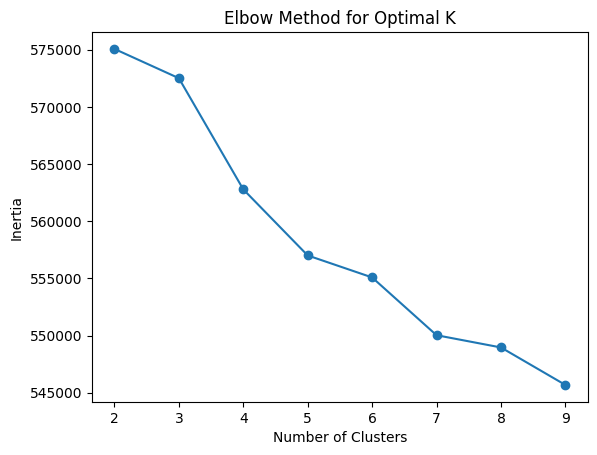

In [71]:
from sklearn.cluster import KMeans

# Use elbow method to find optimal k
inertia = []
for k in range(2, 10):
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(X_scaled)
    inertia.append(kmeans.inertia_)

# Plot elbow curve
import matplotlib.pyplot as plt
plt.plot(range(2, 10), inertia, marker='o')
plt.title("Elbow Method for Optimal K")
plt.xlabel("Number of Clusters")
plt.ylabel("Inertia")
plt.show()

- The most noticeable elbow appears around K = 4.
- After K = 4, the drop in inertia becomes less steep.

In [95]:
optimal_k = 4
kmeans = KMeans(n_clusters=optimal_k, random_state=42)
df_cluster_input['cluster'] = kmeans.fit_predict(X_scaled)

In [73]:
df_cluster_input

,patient_id,procedure_code_y_1011,procedure_code_y_1101,procedure_code_y_1102,procedure_code_y_1103,procedure_code_y_1104,procedure_code_y_1105,procedure_code_y_1110,procedure_code_y_1120,procedure_code_y_1130,...,SVD_92,SVD_93,SVD_94,SVD_95,SVD_96,SVD_97,SVD_98,SVD_99,SVD_100,cluster
0,4,0,0,0,0,0,0,0,0,0,...,0.351423,-0.155019,0.464609,0.558380,-0.400639,-0.524312,0.867817,0.507852,0.004563,3
1,9,0,0,0,1,0,0,0,0,0,...,-0.658138,-0.159248,1.639991,-0.622139,-0.557110,0.394722,0.456202,0.452231,0.023022,1
2,10,0,0,0,1,0,0,0,0,0,...,-1.478751,-0.622829,-0.378982,0.232787,0.240208,0.195519,-0.442379,0.114568,-0.363902,1
3,15,0,0,0,0,0,0,0,0,0,...,0.110029,-0.136961,-0.858896,0.160985,0.196457,-0.995509,0.022908,-0.359942,-0.394029,3
4,16,0,0,0,0,0,0,0,0,0,...,0.733900,-0.030795,0.412789,0.141118,-0.720074,1.322739,0.612670,0.162326,0.179971,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1672,12635,0,0,0,1,0,0,0,0,0,...,0.488130,-0.290675,0.389688,0.174579,0.146308,-0.393173,-0.399056,-0.152401,0.004060,1
1673,12692,0,0,0,0,0,0,0,0,0,...,-0.255470,-0.073209,0.152601,0.467458,0.066793,0.526277,-0.182349,-0.405991,0.325047,3
1674,12767,0,0,0,0,0,0,0,0,0,...,-0.084391,0.706285,-0.292752,-0.144202,-0.039473,0.057352,0.394792,0.045460,0.198033,1
1675,12812,0,0,0,1,0,0,0,0,0,...,0.275387,0.311430,-0.381809,0.135476,0.146322,0.048535,-0.413957,0.077467,0.724220,3


C:\Users\frank\AppData\Local\Temp\ipykernel_41604\3604915599.py:9: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend(title="Cluster")


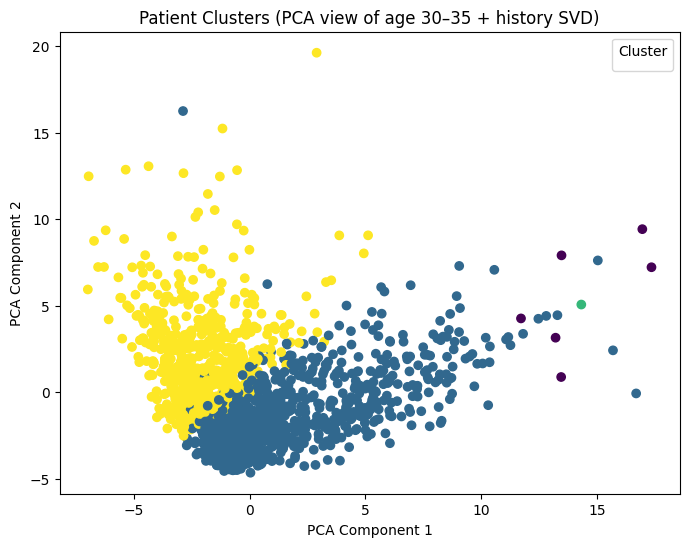

In [99]:
pca = PCA(n_components=2)
X_vis = pca.fit_transform(X_scaled)

plt.figure(figsize=(8, 6))
plt.scatter(X_vis[:, 0], X_vis[:, 1], c=df_cluster_input['cluster'], cmap='viridis')
plt.title("Patient Clusters (PCA view of age 30–35 + history SVD)")
plt.xlabel("PCA Component 1")
plt.ylabel("PCA Component 2")
plt.legend(title="Cluster")
plt.show()

Discussion:  
-   Clustering patients based on:  
    - Their treatment behavior at age 30–35 (df_30_35 one-hot columns)
    - Their broader treatment pattern from SVD (possibly all ages)

-   Clustering hybrid:
    - Current patterns (age 30–35 treatments)
    - Historical Overall context (via SVD)
    - A patient may look similar to another in age 30–35 treatments, but very different in long-term patterns. Clustering based on both helps avoid oversimplified groupings.